In [1]:
import arviz as az
import matplotlib.pyplot as plt
import scipy.stats as stats
import numpy as np
import pandas as pd
import seaborn as sns
import pymc as pm
import pytensor.tensor as pt
import pytensor as pyt
import xarray as xr
import random
import nutpie
import numpyro
import blackjax

az.style.use("arviz-darkgrid")
pyt.config.exception_verbosity = 'low'

In [2]:
first_day_value = 1
first_trial_value = 1

In [3]:
def gamma_shra_from_modesd(m, s):
    v = s**2
    ra = (m + np.sqrt(m**2 + 4*v)) / (2*v)
    sh = 1+m*ra
    return sh,ra

In [4]:
df = pd.read_csv('modeldata.csv')

In [5]:
df

,fish,stage,day,distance,yds,trial
0,fish3,Baseline,1,2.454436,-0.593089,1
1,fish3,Baseline,1,6.767645,3.303538,2
2,fish3,Baseline,1,5.604250,1.553468,3
3,fish3,Baseline,1,9.601868,2.407542,4
4,fish3,Baseline,1,2.919447,0.098092,5
...,...,...,...,...,...,...
1382,fish10,ReRotation,15,2.893217,0.123611,2
1383,fish10,ReRotation,15,2.099540,0.199964,3
1384,fish10,ReRotation,15,2.254680,0.111023,4
1385,fish10,ReRotation,15,5.730466,4.275042,5


## Define model

### Priors

#### μ_μ hyper priors
The mean value of the fish behavior for each day

In [5]:
# Priors for Aμμ
df_avg = df.groupby(['fish', 'stage', 'day']).agg({'yds': 'mean'}).reset_index()

mean_first_day = df_avg[df_avg['day'] == first_day_value]
max_day_indices = df_avg.groupby(['fish', 'stage'])['day'].idxmax()
mean_last_day = df_avg.loc[max_day_indices]

merged_data = pd.merge(mean_first_day, mean_last_day, on=['fish', 'stage'], suffixes=('_first', '_last'))
merged_data['difference'] = merged_data['yds_first'] - merged_data['yds_last']

μ_Aμμ = merged_data['difference'].mean()
σ_Aμμ = merged_data['difference'].std()

# Priors for τ_μμ
merged_data['halfway_yds'] = (merged_data['yds_first'] + merged_data['yds_last']) / 2
df_avg = pd.merge(df_avg, merged_data[['fish', 'stage', 'halfway_yds']], on=['fish', 'stage'])

df_avg_below_halfway = df_avg[df_avg['yds'] < df_avg['halfway_yds']].groupby(['fish', 'stage']).agg({'day': 'first'}).reset_index()

mode_τμ = df_avg_below_halfway['day'].mean()*2
σ_τμ = df_avg_below_halfway['day'].std()*2

sh_τμ,ra_τμ = gamma_shra_from_modesd(mode_τμ, σ_τμ)

# Priors for μ_μ∞
μ_μμ_inf = mean_last_day['yds'].mean()
σ_μμ_inf = mean_last_day['yds'].std()

In [7]:
print(f'{μ_Aμμ=}')
print(f'{σ_Aμμ=}')

print(f'{mode_τμ=}')
print(f'{σ_τμ=}')

print(f'{μ_μμ_inf=}')
print(f'{σ_μμ_inf=}')

μ_Aμμ=0.43480587417444666
σ_Aμμ=2.1082369800260343
mode_τμ=3.75
σ_τμ=2.1756225162774294
μ_μμ_inf=0.40577716150617443
σ_μμ_inf=1.383168036872369


#### σ_μ hyper priors
The standard deviation across fish for the mean behavior on each day.

In [6]:
# Priors for Aσμ
mode_Aσμ = merged_data['difference'].std()
std_Aσμ = merged_data['difference'].std()

sh_Aσμ,ra_Aσμ = gamma_shra_from_modesd(mode_Aσμ, std_Aσμ)

# Priors for σ_μ∞
mode_σμ_inf = mean_last_day['yds'].std()
std_σμ_inf = mean_last_day['yds'].std()

sh_σμ_inf,ra_σμ_inf = gamma_shra_from_modesd(mode_σμ_inf, std_σμ_inf)

In [10]:
print(f'{mode_Aσμ=}')
print(f'{std_Aσμ=}')

# print(f'{μ_τμ=}')
print(f'{σ_τμ=}')



mode_Aσμ=2.1082369800260343
std_Aσμ=2.1082369800260343
σ_τμ=2.1756225162774294


#### σ priors
This is the prior for the σ which controls the likelihood.

In [7]:
# Priors for Aμσ
df_std = df.groupby(['fish', 'stage', 'day']).agg({'yds': 'std'}).reset_index()
df_std.rename(columns={'yds': 'std_yds'}, inplace=True)

std_mean = np.mean(df_std['std_yds'])
std_std = np.std(df_std['std_yds'])

mode_σ = std_mean
σ_σ = std_std

sh_σ,ra_σ = gamma_shra_from_modesd(mode_σ,σ_σ)

In [12]:
print(f'{mode_σ=}')
print(f'{σ_σ=}')

print(f'{sh_σ=}')
print(f'{ra_σ=}')

mode_σ=2.1750377215921626
σ_σ=1.295219427734266
sh_σ=4.602722873290658
ra_σ=1.6563955822584113


### PyMC model code
#### Make codings for fish and stage

In [8]:
fish_list = [3, 7, 9, 10]
days = {'Baseline': 25, 'Rotation': 16, 'Washout': 10, 'ReRotation': 15, 'Washout 2': 10}
stage_list = ['Baseline', 'Rotation', 'Washout', 'ReRotation', 'Washout 2']

fish_index_map = {fish: index for index, fish in enumerate(fish_list)}
stage_index_map = {stage: index for index, stage in enumerate(stage_list)}
# Extracting just the numeric part of the 'fish' column
df['fish_id'] = df['fish'].str.extract('(\d+)').astype(int)  # \d+ matches one or more digits
fish_index_map = {fish: index for index, fish in enumerate(fish_list)}
# Replace fish numbers with their corresponding indices
df['fish_index'] = df['fish_id'].map(fish_index_map)
df['stage_index'] = df['stage'].map(stage_index_map)
df['day_index'] = df['day'] - first_day_value
num_data = df.shape[0]


In [9]:
coords = {
    "fish": fish_list,
    "stages": stage_list,
    "data": np.arange(num_data),
}

with pm.Model(coords=coords) as m_yds:
    ### Constants
    fish_ = pm.ConstantData('fish_', df['fish_index'], dims='data')
    stage_ = pm.ConstantData('stage_', df['stage_index'], dims='data')
    day_ = pm.ConstantData('day_', df['day_index'], dims='data')

    ### level 4: Priors for μ_μ, μ_σ, σ_μ, σ_σ
    A_μμ = pm.Normal('A_μμ', mu=μ_Aμμ, sigma=σ_Aμμ, dims=('fish', 'stages'))
    τ_μ = pm.Gamma('τ_μ', alpha=sh_τμ, beta=ra_τμ, dims=('fish', 'stages'))
    μ_μ_inf = pm.Normal('μ_μ_inf', mu=μ_μμ_inf, sigma=σ_μμ_inf, dims=('fish', 'stages'))

    A_σμ = pm.Gamma('A_σμ', alpha=sh_Aσμ, beta=ra_Aσμ, dims=('fish', 'stages'))
    σ_μ_inf = pm.Gamma('σ_μ_inf', alpha=sh_σμ_inf, beta=ra_σμ_inf, dims=('fish', 'stages'))

    ### level 3: Regression equations for μ
    μ_μ = pm.Deterministic('μ_μ', A_μμ[fish_,stage_]*pm.math.exp(-day_ / τ_μ[fish_,stage_]) + μ_μ_inf[fish_,stage_], dims='data' )
    σ_μ = pm.Deterministic('σ_μ', A_σμ[fish_,stage_]*pm.math.exp(-day_ / τ_μ[fish_,stage_]) + σ_μ_inf[fish_,stage_], dims='data')


     ### level 2: Priors for the likelihood
    μ_std = pm.Normal('μ_std', mu=0, sigma=1, dims='data')
    μ = pm.Deterministic('μ', μ_μ + μ_std*σ_μ)    
    # μ = pm.Normal('μ', mu=μ_μ, sigma=σ_μ, dims='data')    
    σ = pm.Gamma('σ', alpha=sh_σ, beta=ra_σ, dims='data')

    
    ### data likelihood level 1
    # y = pm.StudentT('y', mu=μ, sigma=σ, nu=ν, observed=df['yds'], dims='data')
    y = pm.Normal('y', mu=μ, sigma=σ, observed=df['yds'], dims='data')



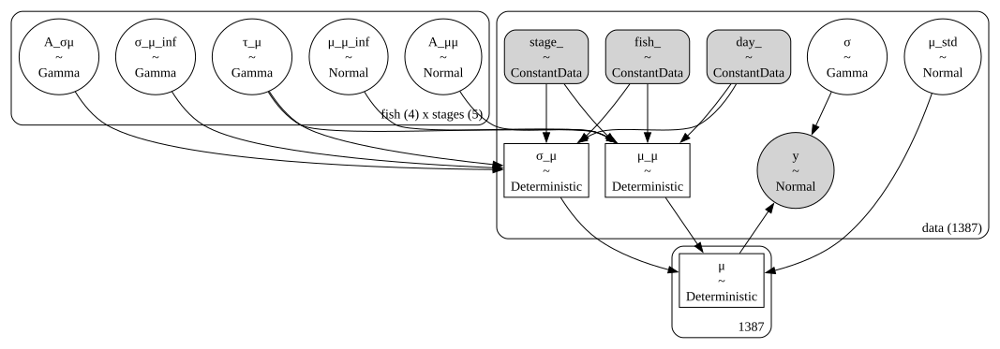

In [101]:
pm.model_to_graphviz(m_yds)

# Priors
## Sample prior predictive

In [10]:
id_yds = pm.sample_prior_predictive(samples=200, model=m_yds)
prior = id_yds.prior
pp = id_yds.prior_predictive
cd = id_yds.constant_data


id_yds

Sampling: [A_μμ, A_σμ, y, μ_std, μ_μ_inf, σ, σ_μ_inf, τ_μ]


Inference data with groups:
	> prior
	> prior_predictive
	> observed_data
	> constant_data

In [11]:
start_day = -25
last_day = start_day

day_ranges = {}
for stage in stage_list:
    day_ranges[stage] = np.arange(last_day, last_day+days[stage])
    last_day = np.max(day_ranges[stage])+1

In [12]:
def plot_hyperparameter_time_course(A_param, τ_param, inf_param, param_name):
    fig, axes = plt.subplots(len(fish_list), 1, figsize=(25, 10)) # Adjust the size as needed
    num_draws_to_plot = 20

    for fish_id,fish_index in fish_index_map.items():
        draws_f = np.random.choice(prior.draw.values, size=num_draws_to_plot, replace=False)
        for stage_id,stage_index in stage_index_map.items():
            prior_fs = prior.sel({'fish': fish_id, 'stages': stage_id, 'draw': draws_f}).squeeze()
            A_fs = prior_fs[A_param]
            inf_fs = prior_fs[inf_param]
            τ_fs = prior_fs[τ_param]
            
            stage_days = xr.DataArray(np.arange(days[stage_id]), dims="days")
            param_vals = A_fs * np.exp(-stage_days / τ_fs) + inf_fs
            
            ax = axes[fish_index] # Get the specific subplot
            ax.plot(day_ranges[stage_id], param_vals.values.T, alpha=0.4, label=f"{stage_id}")
            ax.set_xlabel("Days")
            ax.set_ylabel(param_name)
            ax.set_title(f"Fish {fish_id}")


    fig.suptitle(f'Prior Predictive Checks for {param_name}', fontsize=16)  # Add a main title here
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust the layout to make room for the main title
    plt.tight_layout(pad=4.0)
    plt.show()

C:\Users\86153\AppData\Local\Temp\ipykernel_34428\3239911825.py:24: UserWarning: The figure layout has changed to tight
  plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust the layout to make room for the main title


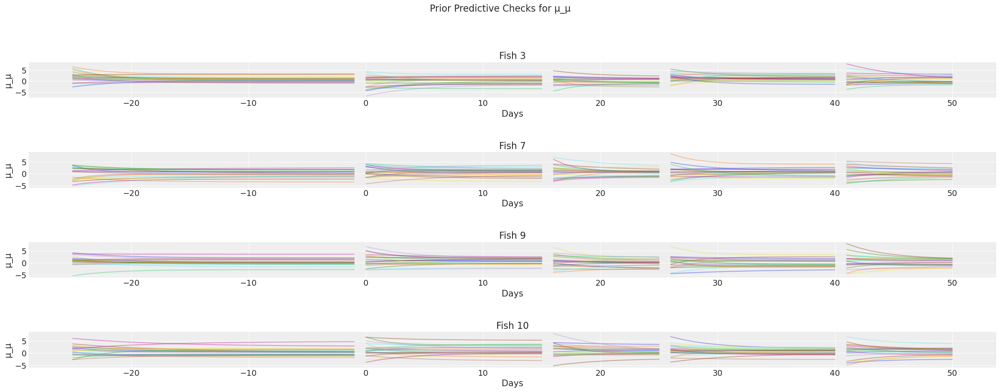

In [13]:
plot_hyperparameter_time_course("A_μμ", "τ_μ", "μ_μ_inf", "μ_μ")


C:\Users\86153\AppData\Local\Temp\ipykernel_34428\3239911825.py:24: UserWarning: The figure layout has changed to tight
  plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust the layout to make room for the main title


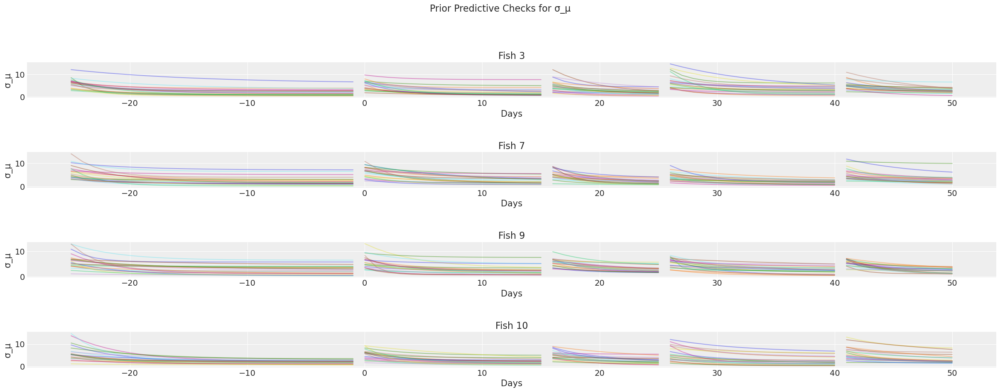

In [14]:
plot_hyperparameter_time_course("A_σμ", "τ_μ", "σ_μ_inf", "σ_μ")

In [13]:
index_stage_map = {v: k for k, v in stage_index_map.items()}
day_range_ = xr.ones_like(cd.day_)
for i in day_range_['data']:
    stage_id = index_stage_map[cd.stage_[i].item()]
    day_range_[i] = day_ranges[stage_id][cd.day_[i].item()-1]


In [14]:
def plot_data_time_course_across_fish(day, data, data_name):
    plot_ds = xr.Dataset(data_vars={'day': day, 'data': data})

    fig, ax = plt.subplots(1, 1, figsize=(14, 3)) # Adjust the size as needed

    plot_df = plot_ds.to_dataframe().reset_index()
    plot_df['day'] = plot_df['day'].astype(int)
    sns.violinplot(data=plot_df, x='day', y='data', ax=ax, inner='quartile')
    ax.set_title(f'{data_name}')
    ax.set_xlabel('Days')
    ax.set_ylabel(f'{data_name}')

In [24]:
# plot_ds = xr.Dataset(data_vars={'day': day_range_, 'fish': cd.fish_, 'mu_y': prior['μ']})

# fig, ax = plt.subplots(1, 1, figsize=(14, 3)) # Adjust the size as needed

# plot_df = plot_ds.to_dataframe().reset_index()
# plot_df['day'] = plot_df['day'].astype(int)
# sns.violinplot(data=plot_df, x='day', y='mu_y', ax=ax, inner='quartile')
# ax.set_title(f'Prior mu_y')
# ax.set_xlabel('Days')
# ax.set_ylabel('mu_yds')

Text(0, 0.5, 'sigma_yds')

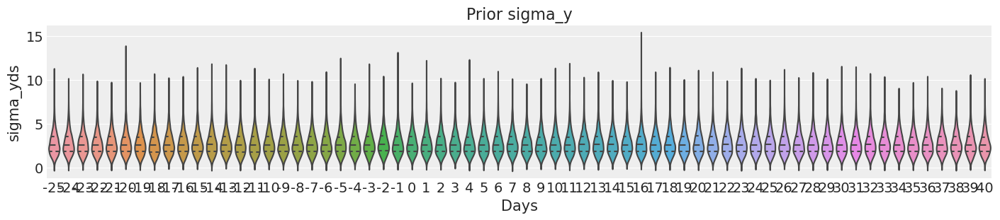

In [17]:
plot_ds = xr.Dataset(data_vars={'day': day_range_, 'fish': cd.fish_, 'sigma_y': prior['σ']})

fig, ax = plt.subplots(1, 1, figsize=(14, 3)) # Adjust the size as needed

plot_df = plot_ds.to_dataframe().reset_index()
plot_df['day'] = plot_df['day'].astype(int)
sns.violinplot(data=plot_df, x='day', y='sigma_y', ax=ax, inner='quartile')
ax.set_title(f'Prior sigma_y')
ax.set_xlabel('Days')
ax.set_ylabel('sigma_yds')

Text(0, 0.5, 'Yds')

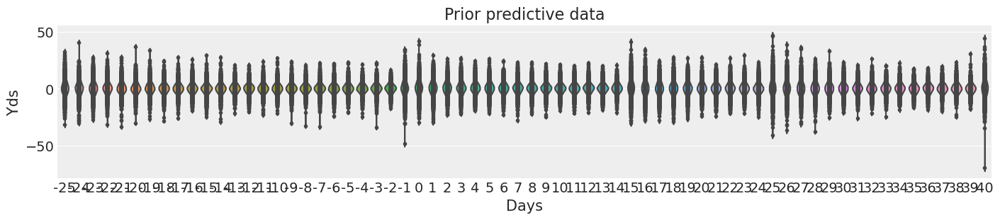

In [18]:
plot_ds = xr.Dataset(data_vars={'day': day_range_, 'fish': cd.fish_, 'y_pp': pp['y']})

fig, ax = plt.subplots(1, 1, figsize=(14, 3)) # Adjust the size as needed

plot_df = plot_ds.to_dataframe().reset_index()
plot_df['day'] = plot_df['day'].astype(int)
sns.violinplot(data=plot_df, x='day', y='y_pp', ax=ax, inner='point')
ax.set_title(f'Prior predictive data')
ax.set_xlabel('Days')
ax.set_ylabel('Yds')

# Try different samplers


## NUTS sampler

In [27]:
with m_yds:
    id_yds.extend(pm.sample(1000, tune=1000, target_accept=0.95, nuts={'max_treedepth':15}), join='right')

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [A_μμ, τ_μ, μ_μ_inf, A_σμ, σ_μ_inf, μ_std, σ]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 104 seconds.
There were 4 divergences after tuning. Increase `target_accept` or reparameterize.


In [28]:
az.summary(id_yds, var_names=['A_μμ', 'A_σμ'], coords={'stages': ['Rotation']})

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
"A_μμ[3, Rotation]",2.749,0.909,1.109,4.545,0.013,0.010,4746.0,3140.0,1.0
"A_μμ[7, Rotation]",0.342,0.972,-1.427,2.209,0.015,0.012,4358.0,3273.0,1.0
"A_μμ[9, Rotation]",2.699,1.529,-0.049,5.656,0.030,0.021,2549.0,3002.0,1.0
"A_μμ[10, Rotation]",2.005,1.184,-0.141,4.222,0.019,0.013,3869.0,3162.0,1.0
"A_σμ[3, Rotation]",1.280,0.725,0.175,2.599,0.012,0.008,3651.0,3024.0,1.0
"A_σμ[7, Rotation]",1.431,0.762,0.142,2.791,0.015,0.011,2483.0,2494.0,1.0
"A_σμ[9, Rotation]",2.257,1.248,0.289,4.536,0.026,0.019,2320.0,2706.0,1.0
"A_σμ[10, Rotation]",2.651,1.152,0.563,4.698,0.023,0.016,2462.0,3078.0,1.0


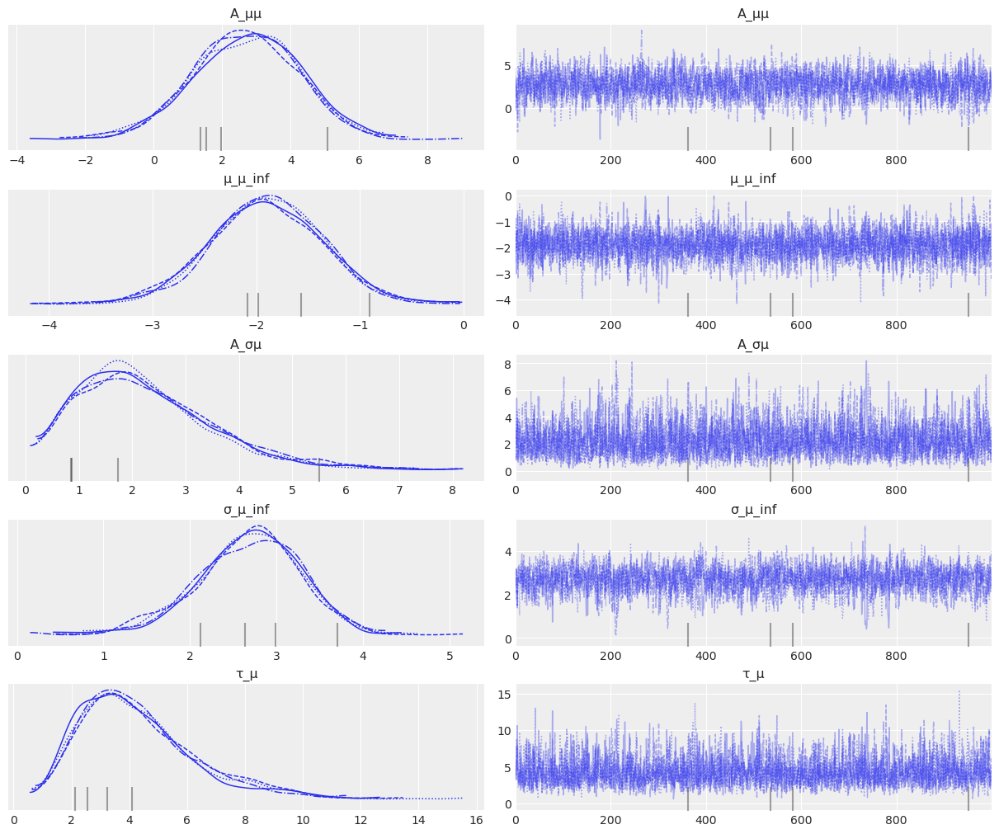

In [29]:
az.plot_trace(id_yds, var_names=['A_μμ', 'μ_μ_inf', 'A_σμ', 'σ_μ_inf', 'τ_μ'], coords={'fish':9, 'stages': 'Rotation'});

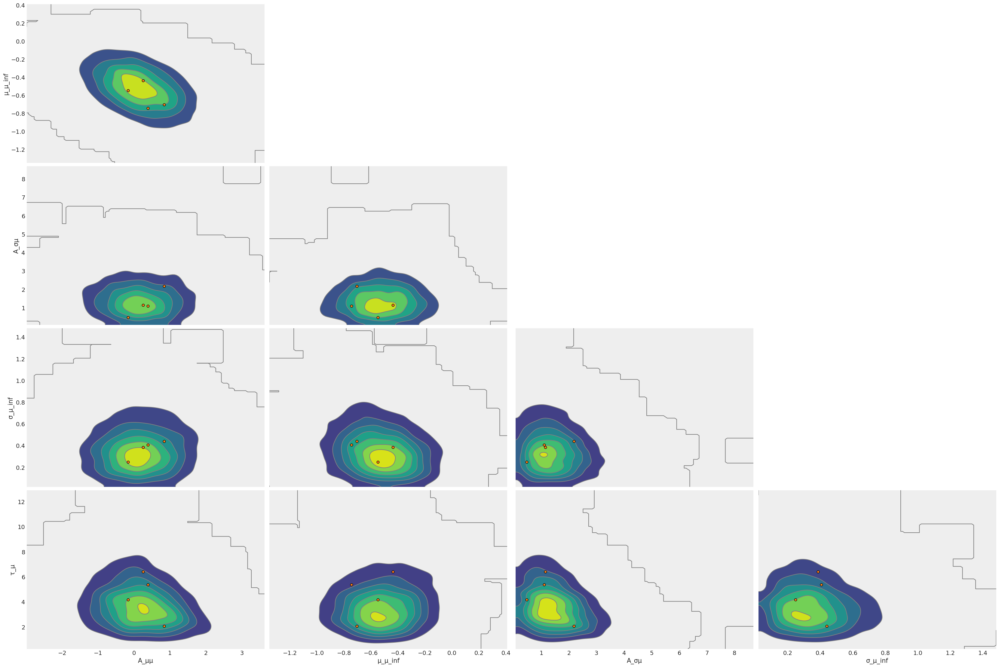

In [30]:
az.plot_pair(id_yds, var_names=['A_μμ', 'μ_μ_inf', 'A_σμ', 'σ_μ_inf', 'τ_μ'], 
             coords={'fish':10, 'stages': 'Baseline'}, 
             divergences=True,
             kind='kde');

## NumPyro JAX NUTS sampler

In [16]:
with m_yds:
    id_yds_numpyro = pm.sample(1000, tune=1000, target_accept=0.95, nuts_sampler="numpyro")

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

There were 2 divergences after tuning. Increase `target_accept` or reparameterize.


In [20]:
az.summary(id_yds_numpyro, var_names=['A_μμ', 'A_σμ'], coords={'stages': ['Rotation']})

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
"A_μμ[3, Rotation]",2.720,0.961,0.890,4.497,0.017,0.012,3242.0,2923.0,1.0
"A_μμ[7, Rotation]",0.300,0.975,-1.454,2.211,0.020,0.015,2457.0,2369.0,1.0
"A_μμ[9, Rotation]",2.657,1.557,-0.277,5.669,0.037,0.026,1791.0,2020.0,1.0
"A_μμ[10, Rotation]",2.031,1.161,-0.070,4.284,0.021,0.015,3059.0,3373.0,1.0
"A_σμ[3, Rotation]",1.277,0.736,0.182,2.591,0.014,0.010,2592.0,3116.0,1.0
"A_σμ[7, Rotation]",1.435,0.778,0.181,2.837,0.015,0.011,2453.0,2813.0,1.0
"A_σμ[9, Rotation]",2.263,1.253,0.334,4.617,0.031,0.023,1887.0,1594.0,1.0
"A_σμ[10, Rotation]",2.637,1.138,0.647,4.794,0.025,0.017,2016.0,2089.0,1.0


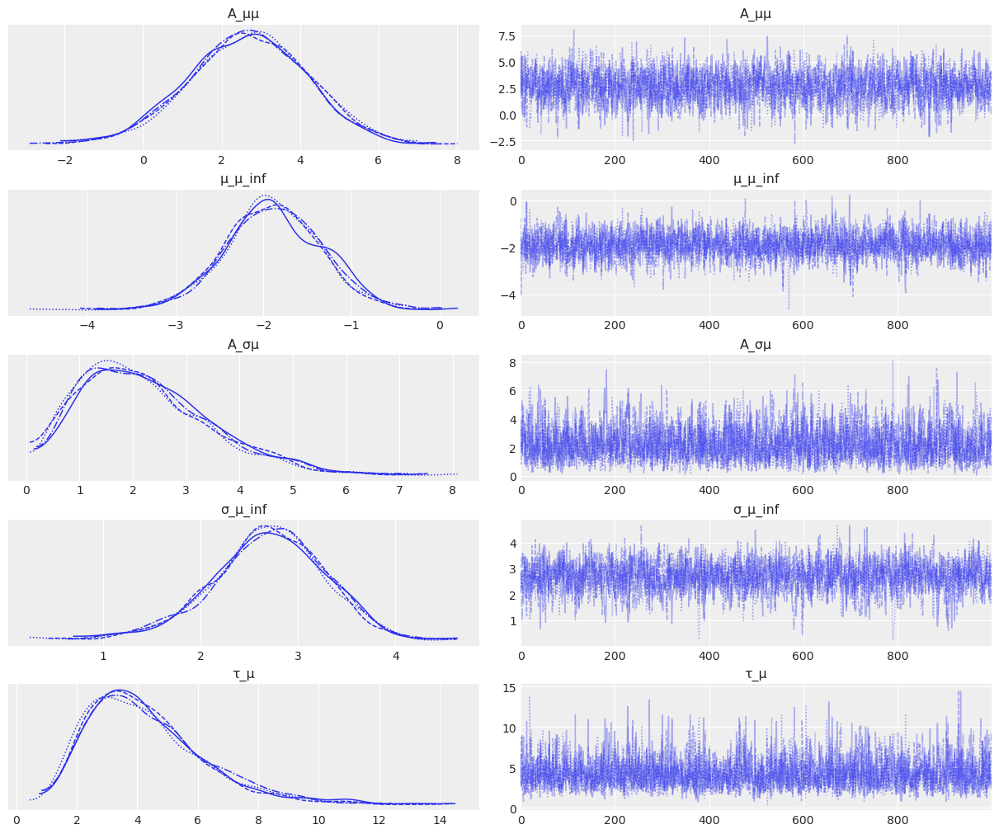

In [21]:
az.plot_trace(id_yds_numpyro, var_names=['A_μμ', 'μ_μ_inf', 'A_σμ', 'σ_μ_inf', 'τ_μ'], coords={'fish':9, 'stages': 'Rotation'});

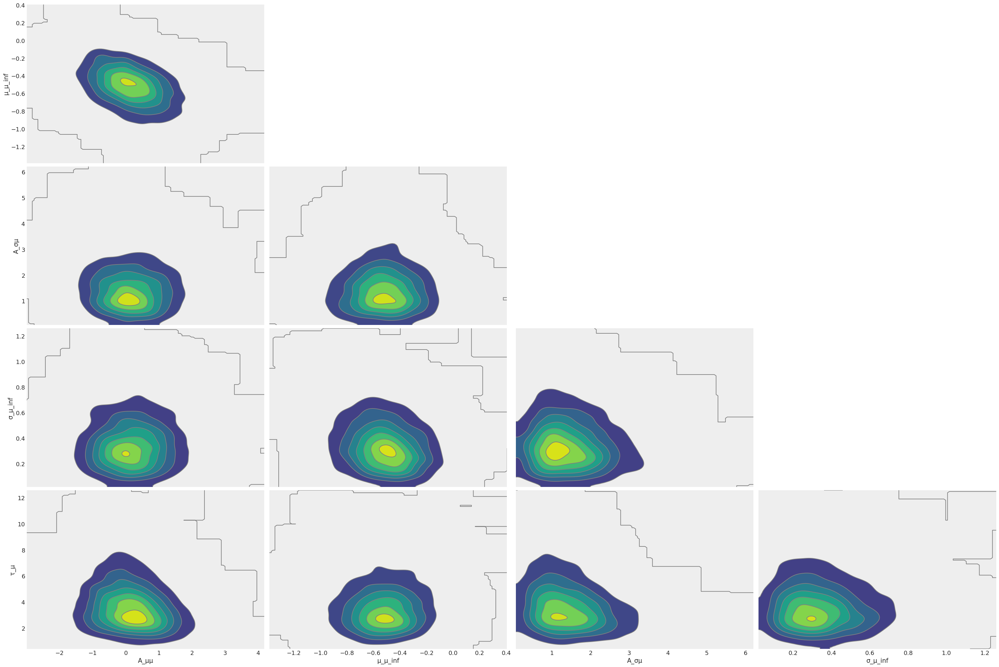

In [21]:
az.plot_pair(id_yds_numpyro, var_names=['A_μμ', 'μ_μ_inf', 'A_σμ', 'σ_μ_inf', 'τ_μ'], 
             coords={'fish':10, 'stages': 'Baseline'}, 
             divergences=True,
             kind='kde');

## BlackJAX NUTS sampler

In [ ]:
with m_yds:
    id_yds_blackjax = pm.sample(1000, tune=1000, target_accept=0.95,nuts_sampler="blackjax")

c:\Users\86153\anaconda3\envs\pymc_env\Lib\site-packages\pymc\sampling\jax.py:383: UserWarning: BlackJax currently only display progress bar correctly under `chain_method == 'vectorized'`. Setting `progressbar=False`.
  warnings.warn(
There were 4 divergences after tuning. Increase `target_accept` or reparameterize.


In [36]:
az.summary(id_yds_blackjax, var_names=['A_μμ', 'A_σμ'], coords={'stages': ['Rotation']})

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
"A_μμ[3, Rotation]",2.720,0.924,0.984,4.480,0.014,0.010,4573.0,3246.0,1.0
"A_μμ[7, Rotation]",0.345,0.964,-1.453,2.175,0.017,0.013,3228.0,3321.0,1.0
"A_μμ[9, Rotation]",2.685,1.515,-0.111,5.498,0.032,0.023,2236.0,3040.0,1.0
"A_μμ[10, Rotation]",2.031,1.180,-0.279,4.150,0.021,0.015,3234.0,2891.0,1.0
"A_σμ[3, Rotation]",1.289,0.732,0.179,2.600,0.013,0.009,2873.0,2618.0,1.0
"A_σμ[7, Rotation]",1.431,0.774,0.136,2.773,0.015,0.010,2776.0,2502.0,1.0
"A_σμ[9, Rotation]",2.248,1.213,0.299,4.457,0.028,0.020,2047.0,2648.0,1.0
"A_σμ[10, Rotation]",2.674,1.123,0.696,4.738,0.023,0.016,2305.0,2832.0,1.0


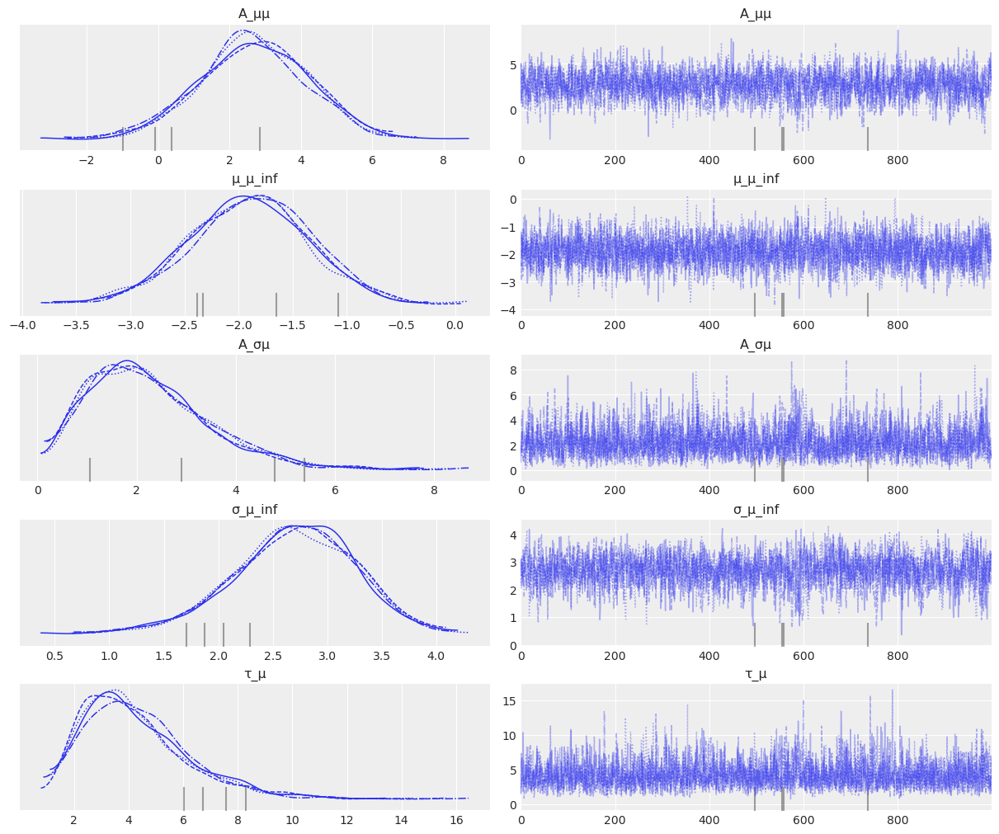

In [37]:
az.plot_trace(id_yds_blackjax, var_names=['A_μμ', 'μ_μ_inf', 'A_σμ', 'σ_μ_inf', 'τ_μ'], coords={'fish':9, 'stages': 'Rotation'});

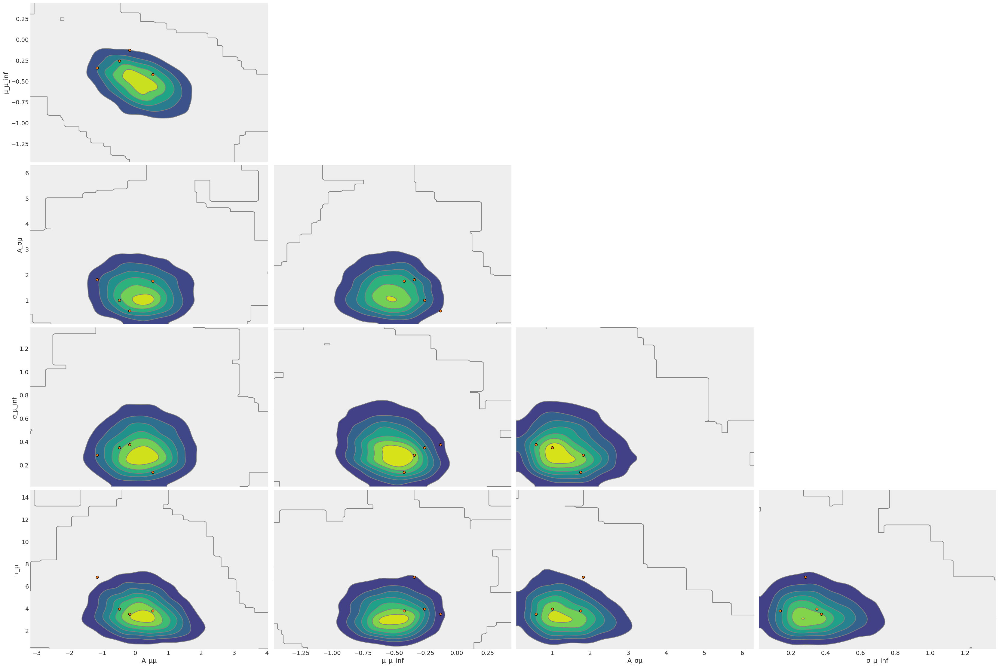

In [38]:
az.plot_pair(id_yds_blackjax, var_names=['A_μμ', 'μ_μ_inf', 'A_σμ', 'σ_μ_inf', 'τ_μ'], 
             coords={'fish':10, 'stages': 'Baseline'}, 
             divergences=True,
             kind='kde');

## Nutpie Rust NUTS sampler

In [39]:
with m_yds:
    id_yds_nutpie = pm.sample(1000, tune=1000, target_accept=0.95,nuts_sampler="nutpie")

c:\Users\86153\anaconda3\envs\pymc_env\Lib\site-packages\pytensor\link\numba\dispatch\basic.py:373: UserWarning: Numba will use object mode to run AdvancedSubtensor's perform method
  warnings.warn(
c:\Users\86153\anaconda3\envs\pymc_env\Lib\site-packages\pytensor\link\numba\dispatch\basic.py:373: UserWarning: Numba will use object mode to run AdvancedSubtensor's perform method
  warnings.warn(
c:\Users\86153\anaconda3\envs\pymc_env\Lib\site-packages\pytensor\link\numba\dispatch\basic.py:373: UserWarning: Numba will use object mode to run AdvancedSubtensor's perform method
  warnings.warn(
c:\Users\86153\anaconda3\envs\pymc_env\Lib\site-packages\pytensor\link\numba\dispatch\basic.py:373: UserWarning: Numba will use object mode to run AdvancedIncSubtensor's perform method
  warnings.warn(
c:\Users\86153\anaconda3\envs\pymc_env\Lib\site-packages\pytensor\link\numba\dispatch\basic.py:373: UserWarning: Numba will use object mode to run AdvancedSubtensor's perform method
  warnings.warn(
c:

In [40]:
az.summary(id_yds_nutpie, var_names=['A_μμ', 'A_σμ'], coords={'stages': ['Rotation']})

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
"A_μμ[3, Rotation]",2.733,0.905,1.008,4.439,0.015,0.011,3514.0,2787.0,1.0
"A_μμ[7, Rotation]",0.332,0.954,-1.361,2.276,0.020,0.014,2259.0,2650.0,1.0
"A_μμ[9, Rotation]",2.674,1.530,-0.194,5.568,0.043,0.030,1268.0,2212.0,1.0
"A_μμ[10, Rotation]",2.036,1.175,-0.239,4.125,0.026,0.018,2059.0,2746.0,1.0
"A_σμ[3, Rotation]",1.259,0.725,0.121,2.551,0.015,0.011,2220.0,2313.0,1.0
"A_σμ[7, Rotation]",1.434,0.753,0.192,2.822,0.016,0.011,2264.0,2287.0,1.0
"A_σμ[9, Rotation]",2.264,1.226,0.268,4.440,0.036,0.026,1245.0,1527.0,1.0
"A_σμ[10, Rotation]",2.600,1.119,0.571,4.628,0.025,0.017,1951.0,2065.0,1.0


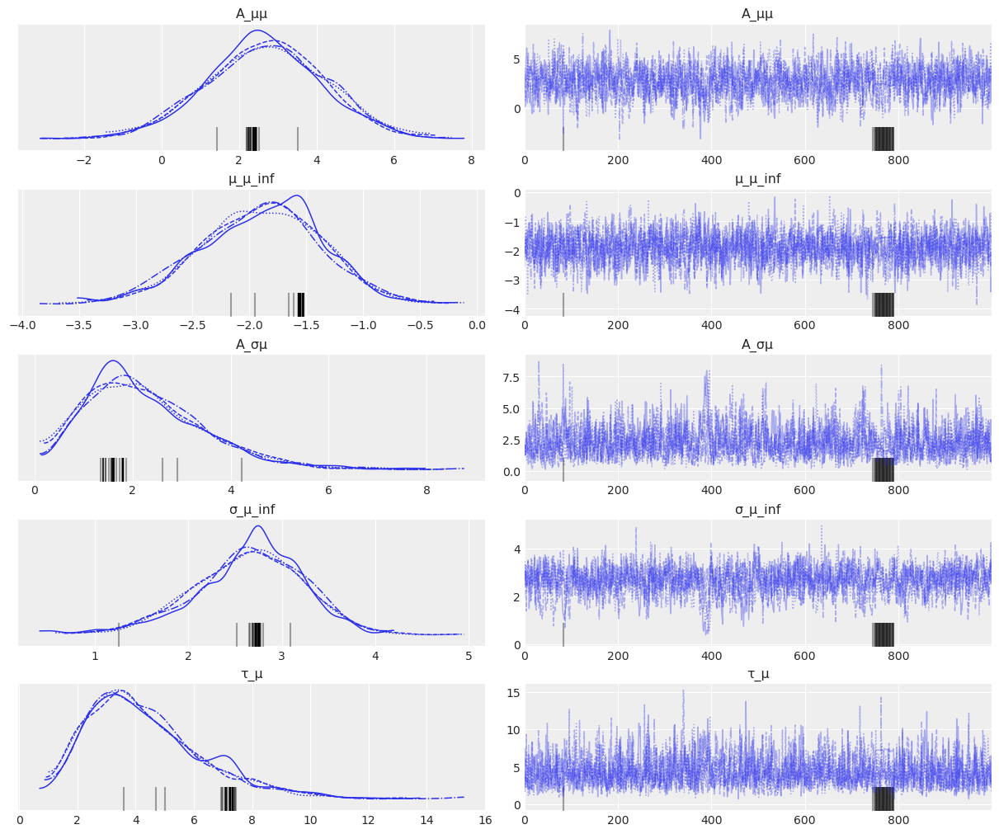

In [41]:
az.plot_trace(id_yds_nutpie, var_names=['A_μμ', 'μ_μ_inf', 'A_σμ', 'σ_μ_inf', 'τ_μ'], coords={'fish':9, 'stages': 'Rotation'});

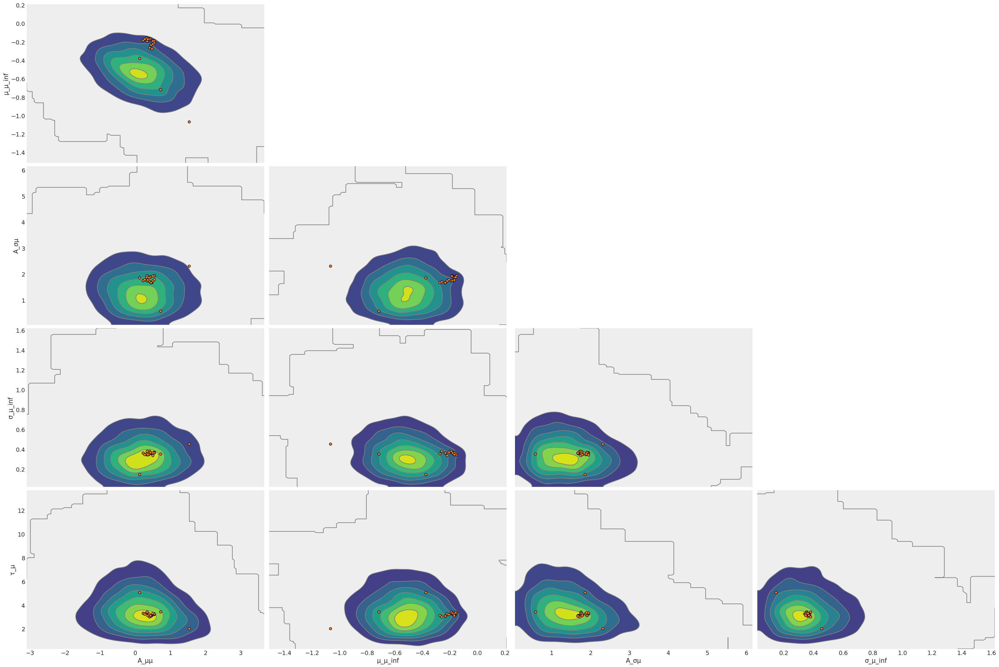

In [42]:
az.plot_pair(id_yds_nutpie, var_names=['A_μμ', 'μ_μ_inf', 'A_σμ', 'σ_μ_inf', 'τ_μ'], 
             coords={'fish':10, 'stages': 'Baseline'}, 
             divergences=True,
             kind='kde');

## Prior preditive plots

In [17]:
with m_yds:
    pm.sample_posterior_predictive(id_yds_numpyro, extend_inferencedata=True)

Sampling: [y]


In [18]:

posterior = id_yds_numpyro.posterior
ppc = id_yds_numpyro.posterior_predictive
cd = id_yds_numpyro.constant_data
obd = id_yds_numpyro.observed_data


In [19]:
id_yds_numpyro

Inference data with groups:
	> posterior
	> posterior_predictive
	> sample_stats
	> observed_data
	> constant_data

In [21]:
def plot_hyperparameter_ppc_course(A_param, τ_param, inf_param, param_name):
    fig, axes = plt.subplots(len(fish_list), 1, figsize=(25, 10)) # Adjust the size as needed
    num_draws_to_plot = 20

    for fish_id,fish_index in fish_index_map.items():
        draws_f = np.random.choice(posterior.draw.values, size=num_draws_to_plot, replace=False)
        for stage_id,stage_index in stage_index_map.items():
            posterior_fs = posterior.sel({'fish': fish_id, 'stages': stage_id, 'draw': draws_f}).squeeze()
            A_fs = posterior_fs[A_param]
            inf_fs = posterior_fs[inf_param]
            τ_fs = posterior_fs[τ_param]
            
            stage_days = xr.DataArray(np.arange(days[stage_id]), dims="days")
            ppc_param_vals = A_fs * np.exp(-stage_days / τ_fs) + inf_fs
            
            ax = axes[fish_index]  # Get the specific subplot
            for draw_idx in range(num_draws_to_plot):
                ax.plot(day_ranges[stage_id], ppc_param_vals.values.T[:, draw_idx, 1], alpha=0.4, label=f"Draw {draw_idx + 1}")

            ax.set_xlabel("Days")
            ax.set_ylabel(param_name)
            ax.set_title(f"Fish {fish_id}")


    fig.suptitle(f'Posterior Predictive Checks for {param_name}', fontsize=16)  # Add a main title here
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust the layout to make room for the main title
    plt.tight_layout(pad=4.0)
    plt.show()

C:\Users\86153\AppData\Local\Temp\ipykernel_34300\1467832152.py:26: UserWarning: The figure layout has changed to tight
  plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust the layout to make room for the main title


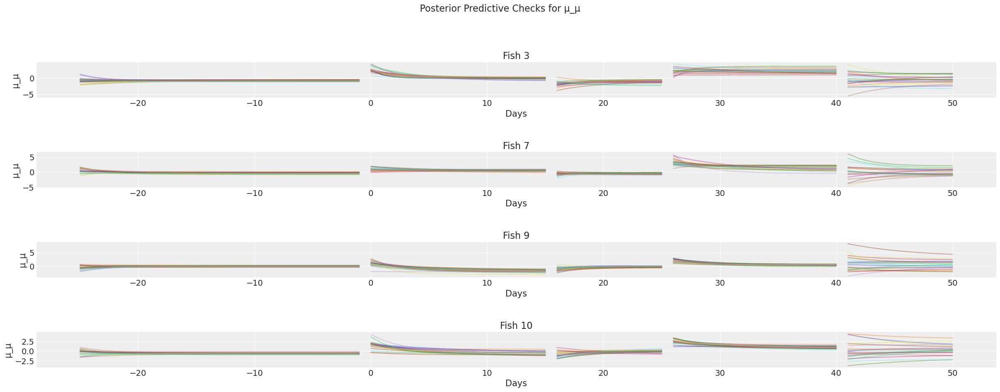

In [27]:
plot_hyperparameter_ppc_course("A_μμ", "τ_μ", "μ_μ_inf", "μ_μ")

C:\Users\86153\AppData\Local\Temp\ipykernel_34300\1467832152.py:26: UserWarning: The figure layout has changed to tight
  plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust the layout to make room for the main title


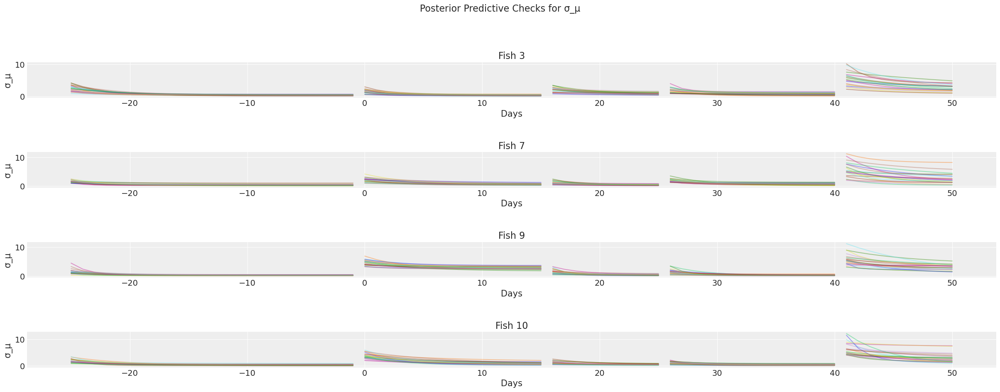

In [28]:
plot_hyperparameter_ppc_course("A_σμ", "τ_μ", "σ_μ_inf", "σ_μ")

In [87]:
def plot_Yds_across_BRWS_fish(data_dir, x_column='day', y_column='yds', hue_column='stage', palette='Set2'):
    """
    Create scatter plots for selected fish IDs in the given directory and save them to individual files.

    Parameters:
    - data_dir: Directory containing CSV files for each fish..
    - output_dir: Directory where the plots will be saved.
    - selected_fish_ids: List of fish IDs for which to create plots.
    - x_column: Name of the column to be plotted on the x-axis (default: 'plotday').
    - y_column: Name of the column to be plotted on the y-axis (default: 'average distance').
    - y_column2: Name of the column to be plotted on the y-axis (default: 'distance').
    - hue_column: Name of the column to determine the color of points (default: 'session_type').
    - palette: Color palette for hue categories (default: 'Set2').
    """
    # Use Seaborn for better aesthetics
    sns.set(style="whitegrid")
    plt.style.use('default')
    palette_colors = [ "orange",'red',"green",'blue']
    # Iterate over each selected fish ID

# Plot for each unique fish ID in the DataFrame
    for fish_id in data_dir['fish'].unique():
                fish_df = data_dir[data_dir['fish'] == fish_id]

                plt.figure(figsize=(14, 4.8))
                sns.lineplot(x=x_column, y=y_column, hue=hue_column,data=fish_df, palette=palette_colors,alpha=0.3)

                #sns.scatterplot(x=x_column, y=y_column2, hue=hue_column, data=fish_df, palette=palette, alpha=0.5)
                plt.title(f'Yds Plot of {fish_id}')
                plt.xlabel('Session #', fontsize=24)
                plt.ylabel('Yds (m)', fontsize=24)
                #plt.legend().set_visible(False)
                plt.legend()
                plt.tight_layout()  # Adjust layout to make room for legend and labels
                plt.grid(False)  # Turn off the grid as specified
                # Get the current axes
                ax = plt.gca()
                # Remove the box outline
                ax.spines['top'].set_visible(False)
                ax.spines['right'].set_visible(False)

                plt.show()

c:\Users\86153\anaconda3\envs\pymc_env\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\86153\anaconda3\envs\pymc_env\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\86153\anaconda3\envs\pymc_env\Lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
c:\Users\86153\anaconda3\envs\pymc_env\Lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping w

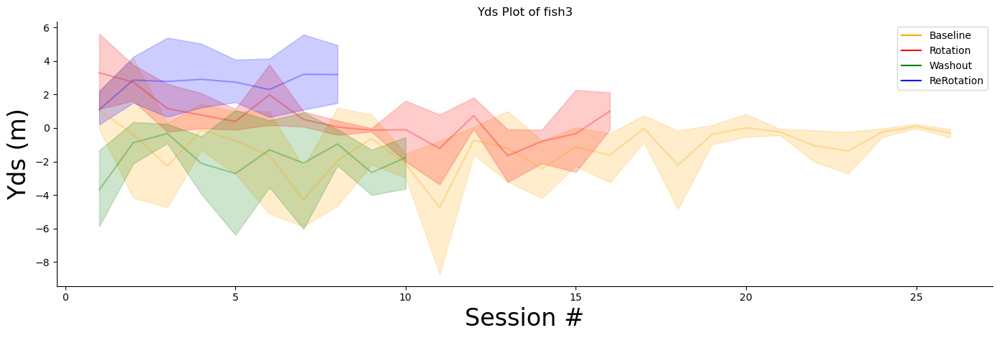

c:\Users\86153\anaconda3\envs\pymc_env\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\86153\anaconda3\envs\pymc_env\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\86153\anaconda3\envs\pymc_env\Lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
c:\Users\86153\anaconda3\envs\pymc_env\Lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping w

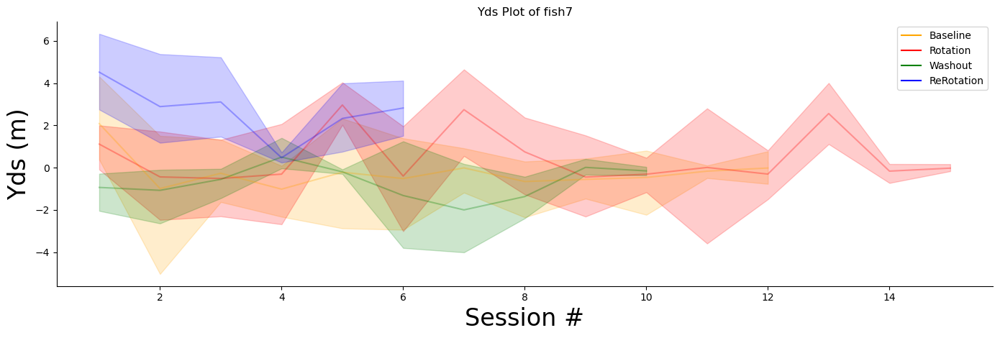

c:\Users\86153\anaconda3\envs\pymc_env\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\86153\anaconda3\envs\pymc_env\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\86153\anaconda3\envs\pymc_env\Lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
c:\Users\86153\anaconda3\envs\pymc_env\Lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping w

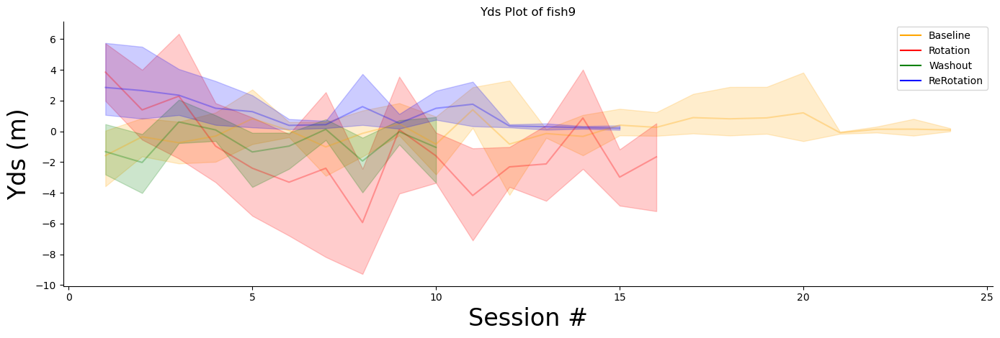

c:\Users\86153\anaconda3\envs\pymc_env\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\86153\anaconda3\envs\pymc_env\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\86153\anaconda3\envs\pymc_env\Lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
c:\Users\86153\anaconda3\envs\pymc_env\Lib\site-packages\seaborn\_oldcore.py:1075: FutureWarning: When grouping w

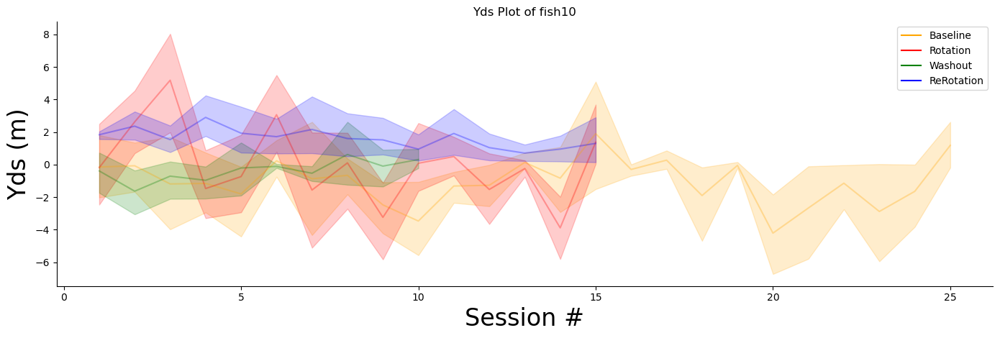

In [88]:
plot_Yds_across_BRWS_fish(df)

In [30]:

# # Define the data ranges for each fish
# fish_ranges = {
#     'Fish 3': (1, 359),
#     'Fish 7': (360, 616),
#     'Fish 9': (617, 1000),
#     'Fish 10': (1001, 1387)
# }

# # Plotting side-by-side
# fig, axes = plt.subplots(nrows=len(fish_ranges), ncols=1, figsize=(12, 8 * len(fish_ranges)))

# for i, (fish_name, (start_idx, end_idx)) in enumerate(fish_ranges.items()):
#     ax = axes[i]
    

    
#     num_draws_to_plot = 50
#     for draw_idx in range(num_draws_to_plot):
#         # Plot posterior predictive data for the current fish and draw
#         ax.plot(range(start_idx, end_idx + 1), ppc.y[1,draw_idx, start_idx - 1:end_idx], 
#                 label=f'{fish_name} - Posterior Predictive (Draw {draw_idx + 1})', color='blue',alpha=0.3)
#     # Plot observed data
#     ax.plot(range(start_idx, end_idx + 1), obd.y[start_idx - 1:end_idx], label='Observed', color='red')
    
#     ax.set_xlabel('Trial')
#     ax.set_ylabel('Yds')
#     ax.set_title(fish_name)
#     #ax.legend()

# plt.tight_layout()
# plt.show()


In [31]:
# # Define the trial phase ranges for each fish
# fish_trial_phases = {
#     'Fish 3': {
#         'Baseline': (1, 155),
#         'Rotation': (156, 251),
#         'Washout': (252, 311),
#         'ReRotation': (312, 359)
#     },
#     'Fish 7': {
#         'Baseline': (360, 430),
#         'Rotation': (431, 520),
#         'Washout': (521, 580),
#         'ReRotation': (581, 616)
#     },
#     'Fish 9': {
#         'Baseline': (617, 757),
#         'Rotation': (758, 852),
#         'Washout': (853, 911),
#         'ReRotation': (912, 1000)
#     },
#     'Fish 10': {
#         'Baseline': (1001, 1149),
#         'Rotation': (1150, 1239),
#         'Washout': (1240, 1299),
#         'ReRotation': (1300, 1387)
#     }
# }

# # Plotting side-by-side for each fish and trial phase
# fig, axes = plt.subplots(nrows=len(fish_trial_phases), ncols=1, figsize=(12, 8 * len(fish_trial_phases)))

# for i, (fish_name, trial_phases) in enumerate(fish_trial_phases.items()):
#     ax = axes[i]
    
#     for phase_name, (start_idx, end_idx) in trial_phases.items():
#         # Plot observed data for the current trial phase
#         ax.plot(range(start_idx, end_idx + 1), obd.y[start_idx - 1:end_idx], label=f'{fish_name} - {phase_name} (Observed)', color='red')
        
#         # Plot posterior predictive data for the current trial phase (using a single draw for simplicity)
#         draw_idx = 0  # Choose a specific draw index to plot (adjust as needed)
#         num_draws_to_plot = 1
#         for draw_idx in range(num_draws_to_plot):
#             ax.plot(range(start_idx, end_idx + 1), ppc.y[1,draw_idx, start_idx - 1:end_idx], 
#                 label=f'{fish_name} - {phase_name}  Posterior Predictive (Draw {draw_idx + 1})', alpha=0.5)
    
#     ax.set_xlabel('Trial')
#     ax.set_ylabel('Yds')
#     ax.set_title(fish_name)
#     #ax.legend()

# plt.tight_layout()
# plt.show()

C:\Users\86153\AppData\Local\Temp\ipykernel_3220\3230016890.py:66: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


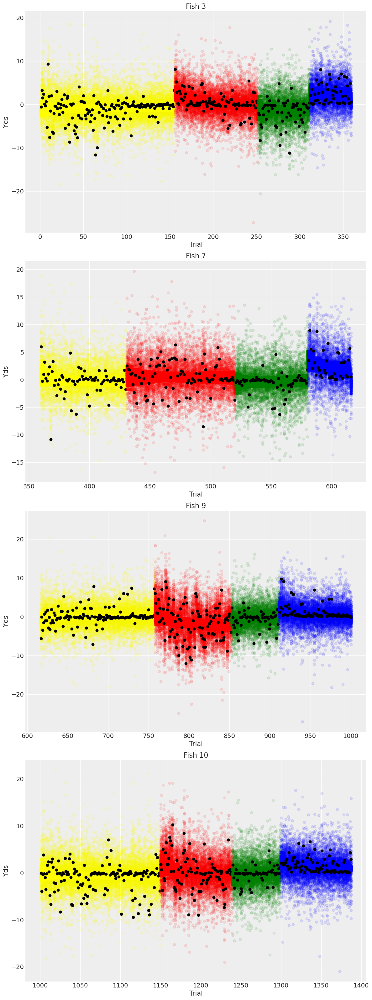

In [22]:


# Define color mapping for trial phases
phase_colors = {
    'Baseline': 'yellow',
    'Rotation': 'red',
    'Washout': 'green',
    'ReRotation': 'blue'
}

# Define the trial phase ranges for each fish
fish_trial_phases = {
    'Fish 3': {
        'Baseline': (1, 155),
        'Rotation': (156, 251),
        'Washout': (252, 311),
        'ReRotation': (312, 359)
    },
    'Fish 7': {
        'Baseline': (360, 430),
        'Rotation': (431, 520),
        'Washout': (521, 580),
        'ReRotation': (581, 616)
    },
    'Fish 9': {
        'Baseline': (617, 757),
        'Rotation': (758, 852),
        'Washout': (853, 911),
        'ReRotation': (912, 1000)
    },
    'Fish 10': {
        'Baseline': (1001, 1149),
        'Rotation': (1150, 1239),
        'Washout': (1240, 1299),
        'ReRotation': (1300, 1387)
    }
}

# Plotting side-by-side for each fish and trial phase
fig, axes = plt.subplots(nrows=len(fish_trial_phases), ncols=1, figsize=(12, 8 * len(fish_trial_phases)))

for i, (fish_name, trial_phases) in enumerate(fish_trial_phases.items()):
    ax = axes[i]
    
    for phase_name, (start_idx, end_idx) in trial_phases.items():
        # Plot posterior predictive data for the current trial phase with the same color
        draw_idx = 0  # Choose a specific draw index to plot (adjust as needed)
        num_draws_to_plot = 100
        for draw_idx in range(num_draws_to_plot):
            ax.scatter(range(start_idx, end_idx + 1), ppc.y[1, draw_idx, start_idx - 1:end_idx], 
                label=f'{fish_name} - {phase_name} Posterior Predictive (Draw {draw_idx + 1})', 
                color=phase_colors[phase_name], alpha=0.1)
            
            ax.scatter(range(start_idx, end_idx + 1), posterior.μ_μ[1, draw_idx, start_idx - 1:end_idx], 
                label=f'{fish_name} - {phase_name} Posterior μ_μ (Draw {draw_idx + 1})', 
                color=phase_colors[phase_name], alpha=0.5)
            # Plot observed data for the current trial phase with specified color
        #ax.plot(range(start_idx, end_idx + 1), obd.y[start_idx - 1:end_idx], 
              #  label=f'{fish_name} - {phase_name} (Observed)', color=phase_colors[phase_name])
        ax.scatter(range(start_idx, end_idx + 1), obd.y[start_idx - 1:end_idx], 
                label=f'{fish_name} - {phase_name} (Observed)', color = 'black' )
        
    ax.set_xlabel('Trial')
    ax.set_ylabel('Yds')
    ax.set_title(fish_name)
    # ax.legend()

plt.tight_layout()
plt.show()


In [23]:
# Assuming 'posterior.μ_μ' is your xarray DataArray with dimensions [chain, draw, data]
# and that it has 1387 data points (or any other number, but for the sake of divisibility we assume a correct truncation)

# Ensure data points can be grouped into sets of 6
num_trials = posterior.μ_μ.shape[2]
num_days = num_trials // 6  # floor division to ignore any remainder trials that do not complete a day
trials_per_day = 6

# Truncate the last few trials if they don't make up a full day
truncated_data = posterior.μ_μ[:, :, :num_days * 6]

# Assign a new coordinate that groups every 6 trials into one day
truncated_data.coords['day'] = ('data', np.repeat(np.arange(num_days), trials_per_day))

# Group by the new 'day' coordinate and calculate the mean
daily_μ_μ = truncated_data.groupby('day').mean('data')

# daily_μ_μ now has dimensions [chain, draw, day] where 'day' represents the aggregated mean of every 6 trials


In [24]:
def get_fish_and_stage(day_index, fish_trial_phases, trials_per_day=6):
    # Convert day index to 1-based trial index
    trial_index = day_index * trials_per_day + 1
    
    # Iterate through each fish and their phases to find where the trial_index falls
    for fish, phases in fish_trial_phases.items():
        for stage, (start, end) in phases.items():
            if start <= trial_index <= end:
                return fish, stage
    
    return None, None  # Return None if no matching fish or stage is found


In [25]:
# Determine the number of days (based on the 'day' dimension)
num_days = daily_μ_μ.sizes['day']

# Create lists to hold the 'fish' and 'stage' labels for each day
fish_labels = []
stage_labels = []

# Loop over each day index to determine the corresponding fish and stage
for day_index in range(num_days):
    # Get the full fish name and stage name for the current day index
    fish, stage = get_fish_and_stage(day_index, fish_trial_phases)
    
    # Append the full fish and stage names to the labels lists
    fish_labels.append(fish)
    stage_labels.append(stage)

# Convert the lists to numpy arrays
fish_labels = np.array(fish_labels)
stage_labels = np.array(stage_labels)

# Add 'fish' and 'stage' as coordinates to the 'day' dimension
daily_μ_μ.coords['fish'] = ('day', fish_labels)
daily_μ_μ.coords['stage'] = ('day', stage_labels)

# Now 'daily_μ_μ' has additional coordinates 'fish' and 'stage' associated with each day

In [27]:
# # Plot posterior distribution with HDI
# pm.plot_posterior(posterior, hdi_prob=0.95, round_to=2)  # Adjust hdi_prob as needed (e.g., 0.95 for 95% HDI)
# plt.xlabel('Parameter of Interest')
# plt.title('Posterior Distribution with 95% HDI')

In [28]:
# # Plot posterior distribution with HDI
# pm.plot_posterior(posterior,var_names=['μ_μ'], hdi_prob=0.95, round_to=4)  # Adjust hdi_prob as needed (e.g., 0.95 for 95% HDI)
# plt.xlabel('Parameter of Interest')
# plt.title('Posterior Distribution with 95% HDI')

In [29]:
# az.plot_ppc(id_yds_numpyro, num_pp_samples=100);

In [30]:
# # Assuming `posterior` is your xarray.DataArray object containing posterior samples
# # Extract samples and flatten them
# samples = posterior.μ_μ.values.flatten()

# # Calculate quantiles and HDI
# quantile_3 = np.percentile(samples, 3)
# quantile_97 = np.percentile(samples, 97)
# hdi_3, hdi_97 = np.percentile(samples, [3, 97])

# # Calculate mean
# mean_value = np.mean(samples)

# # Plotting
# plt.figure(figsize=(8, 6))

# # Plot histogram of samples
# plt.hist(samples, bins=30, density=True, alpha=0.5, label='Posterior Samples')

# # Plot vertical lines for quantiles
# plt.axvline(quantile_3, color='red', linestyle='--', label='3rd Percentile')
# plt.axvline(quantile_97, color='green', linestyle='--', label='97th Percentile')

# # Plot shaded region for HDI
# plt.axvspan(hdi_3, hdi_97, color='blue', alpha=0.3, label='HDI (3-97%)')

# # Plot mean
# plt.axvline(mean_value, color='black', linestyle='-', linewidth=2, label='Mean')

# # Add labels, title, and legend
# plt.xlabel('Parameter of Interest')
# plt.ylabel('Density')
# plt.title('Posterior Distribution with HDI and Quantiles')
# plt.legend()

# # Show plot
# plt.show()

In [26]:
μ_μ_plot = az.summary(posterior, var_names=['μ_μ'], hdi_prob=0.94)  # Adjust hdi_prob as needed (e.g., 0.95 for 94% HDI)

In [27]:
y_ppc_plot = az.summary(ppc, var_names=['y'], hdi_prob=0.94)

In [28]:
y_obd_plot = obd.y.to_dataframe(name="y")

In [30]:

# Define fish_trial_phases dictionary
fish_trial_phases = {
    3: {
        'Baseline': (0, 155),
        'Rotation': (156, 251),
        'Washout': (252, 311),
        'ReRotation': (312, 359)
    },
    7: {
        'Baseline': (360, 430),
        'Rotation': (431, 520),
        'Washout': (521, 580),
        'ReRotation': (581, 616)
    },
    9: {
        'Baseline': (617, 757),
        'Rotation': (758, 852),
        'Washout': (853, 911),
        'ReRotation': (912, 1000)
    },
    10: {
        'Baseline': (1001, 1149),
        'Rotation': (1150, 1239),
        'Washout': (1240, 1299),
        'ReRotation': (1300, 1387)
    }
}

# Function to determine trial phase based on row index
def get_trial_phase(index):
    for fish, phases in fish_trial_phases.items():
        for phase, (start, end) in phases.items():
            if start <= index <= end:
                return fish, phase, index - start + 1
    # Return default values (e.g., NaN) if no trial phase is found
    return None, None, None

# Apply function to create new columns 'fish', 'stage', 'day'
y_obd_plot['index'] = y_obd_plot.index  # Create a new column 'index' to work with the index
y_obd_plot['fish'], y_obd_plot['stage'], y_obd_plot['day'] = zip(*y_obd_plot['index'].map(get_trial_phase))

# Drop the 'index' column (optional)
y_obd_plot.drop(columns=['index'], inplace=True)
# Map day values such that each 6-day cycle is treated as 1 day
y_obd_plot['day'] = np.ceil(y_obd_plot['day'] / 6).astype(int)


In [31]:
# Rename columns in each DataFrame
μ_μ_plot_renamed = μ_μ_plot.rename(columns={'mean': 'μ_μ_y', 'hdi_3%': 'μ_μ_hdi_3%','hdi_97%': 'μ_μ_hdi_97%'})
y_ppc_plot_renamed = y_ppc_plot.rename(columns={'mean': 'ppc_y', 'hdi_3%': 'ppc_hdi_3%','hdi_97%': 'ppc_hdi_97%'})

In [32]:
μ_μ_plot_renamed = μ_μ_plot_renamed.reset_index(drop=True) 
y_ppc_plot_renamed = y_ppc_plot_renamed.reset_index(drop=True) 

In [33]:
ppcplot_df = pd.concat([y_obd_plot, μ_μ_plot_renamed[['μ_μ_y','μ_μ_hdi_3%','μ_μ_hdi_97%']], y_ppc_plot_renamed[['ppc_y','ppc_hdi_3%','ppc_hdi_97%']]], axis=1)

In [63]:
# Define a list of stages in the correct order
stages = ['Baseline', 'Rotation', 'Washout', 'ReRotation']


# Define color mapping for trial phases
phase_colors = {
    'Baseline': 'yellow',
    'Rotation': 'red',
    'Washout': 'green',
    'ReRotation': 'blue'
}
# Convert 'stage' column to categorical type with specified order
ppcplot_df['stage'] = pd.Categorical(ppcplot_df['stage'], categories=stages, ordered=True)

# Group by 'fish', 'stage', and 'day' columns, calculate mean of 'y' for each group
ppcplot_df_day = ppcplot_df.groupby(['fish','stage', 'day']).agg(
    mean_y =('y', 'mean'),
    mean_μ_μ_y =('μ_μ_y', 'mean'),
    mean_μ_μ_hdi_3 =('μ_μ_hdi_3%', 'mean'),
    mean_μ_μ_hdi_97 =('μ_μ_hdi_97%', 'mean'),
    mean_ppc_y =('ppc_y', 'mean'),
    mean_ppc_hdi_3 =('ppc_hdi_3%', 'mean'),
    mean_ppc_hdi_97 =('ppc_hdi_97%', 'mean')
).reset_index()

# Define conditions to set 'plotday' to NaN where 'mean_y' is NaN
condition = pd.isna(ppcplot_df_day['mean_y'])

# Set 'plotday' to NaN where 'mean_y' is NaN
ppcplot_df_day.loc[condition, 'plotday'] = None

# Calculate 'plotday' based on change in 'day' within the same 'fish' group where 'mean_y' is not NaN
ppcplot_df_day.loc[~condition, 'plotday'] = (
    ppcplot_df_day.loc[~condition].groupby('fish').cumcount()
    + (ppcplot_df_day.loc[~condition, 'day'] != ppcplot_df_day.loc[~condition, 'day'].shift()).astype(int)
)
ppcplot_df_day = ppcplot_df_day[pd.notna(ppcplot_df_day['mean_y'])]
ppcplot_df_day['plotday'] = pd.to_numeric(ppcplot_df_day['plotday'], errors='coerce')



C:\Users\86153\AppData\Local\Temp\ipykernel_3220\1682164317.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  ppcplot_df_day = ppcplot_df.groupby(['fish','stage', 'day']).agg(


In [65]:

# Save the DataFrame to CSV file
ppcplot_df_day.to_csv('ppcplot.csv', index=False)

In [61]:
# # Iterate over each unique combination of fish and stage to create plots
# for fish in ppcplot_df_day['fish'].unique():
#     plt.figure(figsize=(14, 4.8))  # Set figure size
    
#     for i, stage in enumerate(stages):
# # Filter data for the current fish and stage
#         data_filter = ppcplot_df_day[(ppcplot_df_day['fish'] == fish) & (ppcplot_df_day['stage'] == stage)]
        
#         # Plot mean_y against plotday for the current stage
#         plt.plot(data_filter['plotday'], data_filter['mean_y'], label=f'Mean Y - {stage}', color=phase_colors[stage])
#                  # Plot mean_y against plotday for the current stage
#         plt.plot(data_filter['plotday'], data_filter['mean_μ_μ_hdi_3'] ,label=f'mean_μ_μ_hdi_3 - {stage}', color=phase_colors[stage], alpha=0.5,)
#         plt.plot(data_filter['plotday'], data_filter['mean_μ_μ_hdi_97'] ,label=f'mean_μ_μ_hdi_97 - {stage}', color=phase_colors[stage], alpha=0.5,)
           
#          # Plot HDI (mean_μ_μ_hdi_3% to mean_μ_μ_hdi_97%) as shaded region
#        # plt.fill_between(data_filter['plotday'], data_filter['mean_μ_μ_hdi_3'], data_filter['mean_μ_μ_hdi_97'],color=phase_colors[stage], alpha=0.3, label=f'HDI - {stage}')
#         plt.plot(data_filter['plotday'], data_filter['mean_ppc_hdi_3'] ,label=f'mean_ppc_hdi_3 - {stage}', color=phase_colors[stage], alpha=0.3,)
#         plt.plot(data_filter['plotday'], data_filter['mean_ppc_hdi_97'] ,label=f'mean_ppc_hdi_97 - {stage}', color=phase_colors[stage], alpha=0.3,)    

#             # Plot PPC HDI (mean_ppc_hdi_3% to mean_ppc_hdi_97%) as shaded region
#         #plt.fill_between(data_filter['plotday'], data_filter['mean_ppc_hdi_3'], data_filter['mean_ppc_hdi_97'],
#         #                     color=phase_colors[stage], alpha=0.1, label=f'HDI PPC - {stage}')
    
#     plt.xlabel('Plot Day')  # Set x-axis label
#     plt.ylabel('Mean Y')   # Set y-axis label
#     plt.title(f'Fish {fish} - Mean Yds by Stage')  # Set plot title
#    # plt.legend()  # Show legend
#     plt.ylim((-10,10))
#     plt.grid(True)  # Show grid
#     plt.show()  # Display the plot


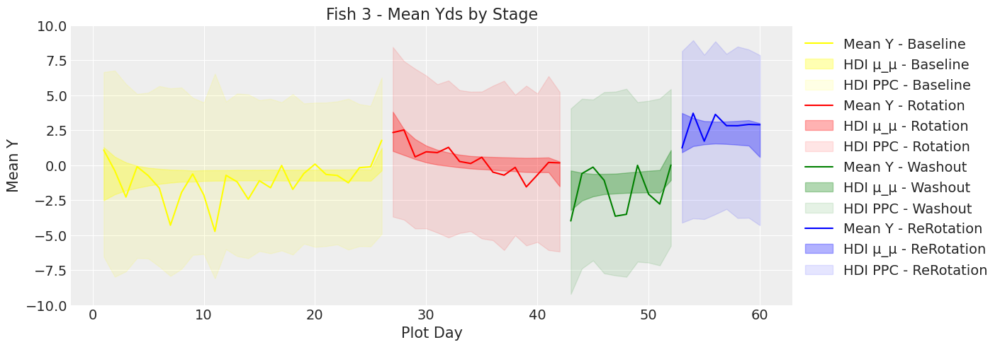

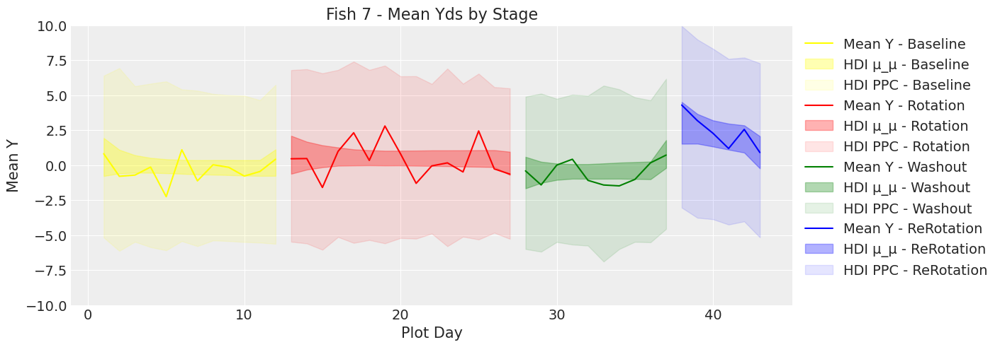

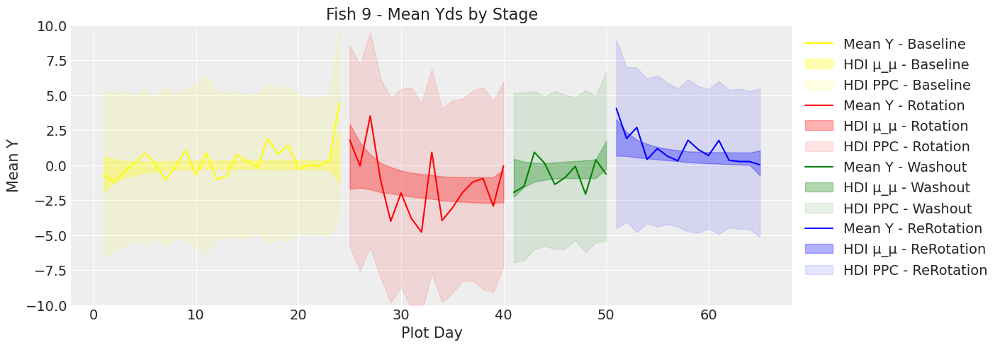

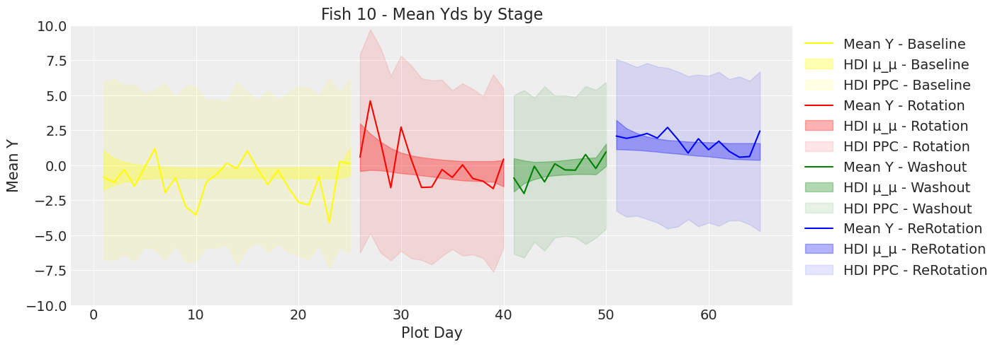

In [68]:
# Iterate over each unique combination of fish and stage to create plots
for fish in ppcplot_df_day['fish'].unique():
    plt.figure(figsize=(14, 4.8))  # Set figure size
    
    for i, stage in enumerate(stages):
# Filter data for the current fish and stage
        data_filter = ppcplot_df_day[(ppcplot_df_day['fish'] == fish) & (ppcplot_df_day['stage'] == stage)]
        
        # Plot mean_y against plotday for the current stage
        plt.plot(data_filter['plotday'], data_filter['mean_y'], label=f'Mean Y - {stage}', color=phase_colors[stage])
                 # Plot mean_y against plotday for the current stage
        # plt.plot(data_filter['plotday'], data_filter['mean_μ_μ_hdi_3'] ,label=f'mean_μ_μ_hdi_3 - {stage}', color=phase_colors[stage], alpha=0.5,)
        # plt.plot(data_filter['plotday'], data_filter['mean_μ_μ_hdi_97'] ,label=f'mean_μ_μ_hdi_97 - {stage}', color=phase_colors[stage], alpha=0.5,)
           
         # Plot HDI (mean_μ_μ_hdi_3% to mean_μ_μ_hdi_97%) as shaded region
        plt.fill_between(data_filter['plotday'], data_filter['mean_μ_μ_hdi_3'], data_filter['mean_μ_μ_hdi_97'],color=phase_colors[stage], alpha=0.3, label=f'HDI μ_μ - {stage}')
        # plt.plot(data_filter['plotday'], data_filter['mean_ppc_hdi_3'] ,label=f'mean_ppc_hdi_3 - {stage}', color=phase_colors[stage], alpha=0.3,)
        # plt.plot(data_filter['plotday'], data_filter['mean_ppc_hdi_97'] ,label=f'mean_ppc_hdi_97 - {stage}', color=phase_colors[stage], alpha=0.3,)    

            # Plot PPC HDI (mean_ppc_hdi_3% to mean_ppc_hdi_97%) as shaded region
        plt.fill_between(data_filter['plotday'], data_filter['mean_ppc_hdi_3'], data_filter['mean_ppc_hdi_97'],
                            color=phase_colors[stage], alpha=0.1, label=f'HDI PPC - {stage}')
    
    plt.xlabel('Plot Day')  # Set x-axis label
    plt.ylabel('Mean Y')   # Set y-axis label
    plt.title(f'Fish {fish} - Mean Yds by Stage')  # Set plot title
    plt.legend( bbox_to_anchor=(1, 1))
       # Set fixed data ranges for both axes
    plt.ylim((-10,10))
    plt.grid(True)  # Show grid
    plt.show()  # Display the plot


TypeError: ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''

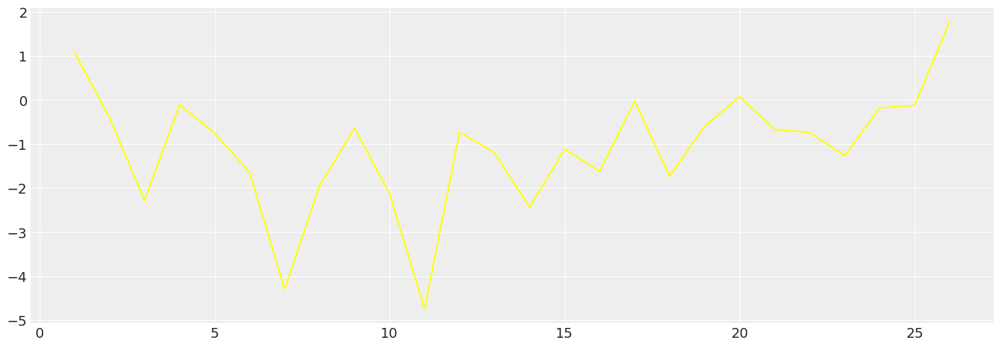

In [ ]:
plt.figure(figsize=(14, 4.8))  # Set figure size
    
for i, stage in enumerate(stages):
# Filter data for the current fish and stage
        data_filter = ppcplot_df_day[(ppcplot_df_day['fish'] == 3) & (ppcplot_df_day['stage'] == 'Baseline')]
        
        # Plot mean_y against plotday for the current stage
        plt.plot(data_filter['plotday'], data_filter['mean_y'], label=f'Mean Y - {stage}', color=phase_colors[stage])
                 # Plot mean_y against plotday for the current stage
        # plt.plot(data_filter['plotday'], data_filter['mean_μ_μ_hdi_3'] ,label=f'mean_μ_μ_hdi_3 - {stage}', color=phase_colors[stage], alpha=0.5,)
        # plt.plot(data_filter['plotday'], data_filter['mean_μ_μ_hdi_97'] ,label=f'mean_μ_μ_hdi_97 - {stage}', color=phase_colors[stage], alpha=0.5,)
           
         # Plot HDI (mean_μ_μ_hdi_3% to mean_μ_μ_hdi_97%) as shaded region
        plt.fill_between(data_filter['plotday'], data_filter['mean_μ_μ_hdi_3'].values, data_filter['mean_μ_μ_hdi_97'].values,color=phase_colors[stage], alpha=0.3, label=f'HDI - {stage}')
        # plt.plot(data_filter['plotday'], data_filter['mean_ppc_hdi_3'] ,label=f'mean_ppc_hdi_3 - {stage}', color=phase_colors[stage], alpha=0.3,)
        # plt.plot(data_filter['plotday'], data_filter['mean_ppc_hdi_97'] ,label=f'mean_ppc_hdi_97 - {stage}', color=phase_colors[stage], alpha=0.3,)    

            # Plot PPC HDI (mean_ppc_hdi_3% to mean_ppc_hdi_97%) as shaded region
     #   plt.fill_between(data_filter['plotday'], data_filter['mean_ppc_hdi_3'], data_filter['mean_ppc_hdi_97'],
     #                       color=phase_colors[stage], alpha=0.1, label=f'HDI PPC - {stage}')
    
plt.xlabel('Plot Day')  # Set x-axis label
plt.ylabel('Mean Y')   # Set y-axis label
plt.title(f'Fish {fish} - Mean Yds by Stage')  # Set plot title
   # plt.legend()  # Show legend
       # Set fixed data ranges for both axes
plt.ylim((-10,10))
plt.grid(True)  # Show grid
plt.show()  # Display the plot


In [ ]:
data_filter = ppcplot_df_day[(ppcplot_df_day['fish'] == 3) & (ppcplot_df_day['stage'] == 'Baseline')]
data_filter['mean_μ_μ_hdi_3']



0    -2.515000
1    -2.088000
2    -1.816000
3    -1.629000
4    -1.472000
5    -1.344000
6    -1.256000
7    -1.188000
8    -1.184000
9    -1.134000
10   -1.116000
11   -1.116000
12   -1.096000
13   -1.100000
14   -1.096000
15   -1.097000
16   -1.112000
17   -1.114167
18   -1.115333
19   -1.117167
20   -1.118000
21   -1.117667
22   -1.115667
23   -1.115000
24   -1.120667
25   -0.381667
Name: mean_μ_μ_hdi_3, dtype: float64

In [ ]:
data_filter['mean_μ_μ_hdi_97']

0     1.282000
1     0.597000
2     0.190000
3    -0.054000
4    -0.190000
5    -0.268000
6    -0.330000
7    -0.345000
8    -0.395000
9    -0.370000
10   -0.364000
11   -0.366000
12   -0.343000
13   -0.347000
14   -0.341000
15   -0.331000
16   -0.340000
17   -0.335500
18   -0.332667
19   -0.330167
20   -0.325500
21   -0.322000
22   -0.316167
23   -0.312833
24   -0.316667
25    1.223667
Name: mean_μ_μ_hdi_97, dtype: float64

In [ ]:
data_filter['plotday']

0      1
1      2
2      3
3      4
4      5
5      6
6      7
7      8
8      9
9     10
10    11
11    12
12    13
13    14
14    15
15    16
16    17
17    18
18    19
19    20
20    21
21    22
22    23
23    24
24    25
25    26
Name: plotday, dtype: object

In [ ]:
data_filter['plotday'] = pd.to_numeric(data_filter['plotday'], errors='coerce')


C:\Users\86153\AppData\Local\Temp\ipykernel_3220\1956722563.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_filter['plotday'] = pd.to_numeric(data_filter['plotday'], errors='coerce')


In [ ]:
data_filter['plotday']

0      1
1      2
2      3
3      4
4      5
5      6
6      7
7      8
8      9
9     10
10    11
11    12
12    13
13    14
14    15
15    16
16    17
17    18
18    19
19    20
20    21
21    22
22    23
23    24
24    25
25    26
Name: plotday, dtype: int64

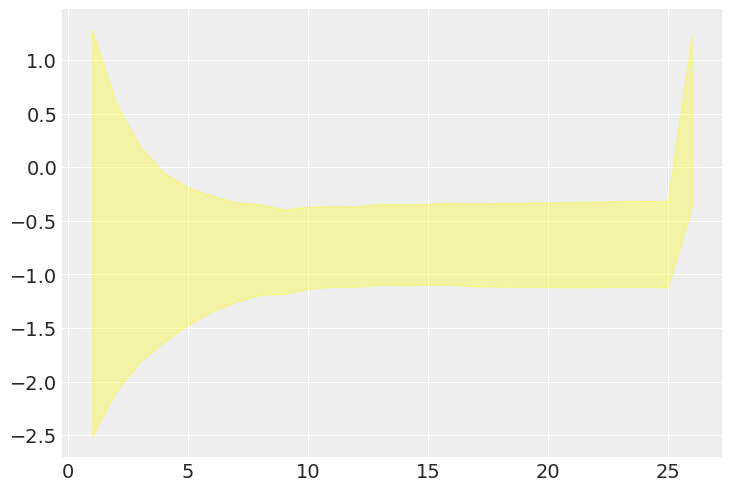

In [ ]:
plt.fill_between(data_filter['plotday'].values, data_filter['mean_μ_μ_hdi_3'].values, data_filter['mean_μ_μ_hdi_97'].values,color=phase_colors[stage], alpha=0.3, label=f'HDI - {stage}')